In [50]:
import pandas as pd

df = pd.read_csv("covid_source_data-clean.csv")
df.head()

,Province_State,Last_Update,Confirmed,Deaths,Recovered,Active
0,Virgin Islands,NaN,51,1,43,50
1,Alabama,2020-07-29 04:35:24,82366,1491,32510,48365.0
2,Alabama,2020-08-09 04:35:07,100173,1755,37923,60495.0
3,Alabama,2020-06-10 04:07:14,21422,729,11395,9298.0
4,Alabama,2020-07-22 04:34:54,70358,1303,29736,39319.0


In [51]:
#Remove unncessary columns and fix types
df = df[['Province_State','Last_Update','Active']]
df.head()

,Province_State,Last_Update,Active
0,Virgin Islands,NaN,50
1,Alabama,2020-07-29 04:35:24,48365.0
2,Alabama,2020-08-09 04:35:07,60495.0
3,Alabama,2020-06-10 04:07:14,9298.0
4,Alabama,2020-07-22 04:34:54,39319.0


In [52]:
#This data contains islands and other US territories, we're only mapping the continental US 
#Lets drop data for areas we aren't mapping
contiguous_states = ['Alabama','Arizona', 'Arkansas', 'California', 'Colorado', 'Connecticut', 'Delaware', 'District of Columbia', 'Florida', 'Georgia', 'Idaho', 'Illinois', 'Indiana', 'Iowa', 'Kansas', 'Kentucky', 'Louisiana', 'Maine', 'Maryland', 'Massachusetts', 'Michigan', 'Minnesota', 'Mississippi', 'Missouri', 'Montana', 'Nebraska', 'Nevada', 'New Hampshire', 'New Jersey', 'New Mexico', 'New York', 'North Carolina', 'North Dakota', 'Ohio', 'Oklahoma', 'Oregon', 'Pennsylvania', 'Rhode Island', 'South Carolina', 'South Dakota', 'Tennessee', 'Texas', 'Utah', 'Vermont', 'Virginia', 'Washington', 'West Virginia', 'Wisconsin', 'Wyoming']

df = df[df['Province_State'].isin(contiguous_states) == True]
df.head()

,Province_State,Last_Update,Active
1,Alabama,2020-07-29 04:35:24,48365.0
2,Alabama,2020-08-09 04:35:07,60495.0
3,Alabama,2020-06-10 04:07:14,9298.0
4,Alabama,2020-07-22 04:34:54,39319.0
5,Alabama,2020-07-28 04:59:02,47114.0


In [53]:
#Lets cleaning the data by breaking out the date column
df['Last_Update'] = pd.to_datetime(df['Last_Update'])
df['Week'] = df['Last_Update'].dt.week
df['Day'] = df['Last_Update'].dt.day  
df['Month'] = df['Last_Update'].dt.month 
df['Short_Date'] = df['Month'].astype(str).str.cat(df['Day'].astype(str),sep="-")

df.head()

,Province_State,Last_Update,Active,Week,Day,Month,Short_Date
1,Alabama,2020-07-29 04:35:24,48365.0,31,29,7,7-29
2,Alabama,2020-08-09 04:35:07,60495.0,32,9,8,8-9
3,Alabama,2020-06-10 04:07:14,9298.0,24,10,6,6-10
4,Alabama,2020-07-22 04:34:54,39319.0,30,22,7,7-22
5,Alabama,2020-07-28 04:59:02,47114.0,31,28,7,7-28


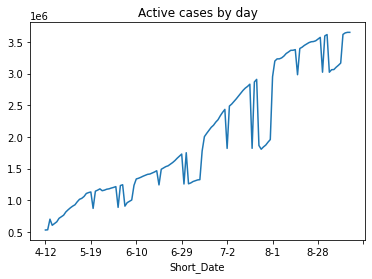

In [54]:
#Now that we have our data lets plot active cases over each week
df['Active'] = df['Active'].astype('str').astype('float')
df.groupby('Short_Date')['Active'].sum().plot(title="Active cases by day")


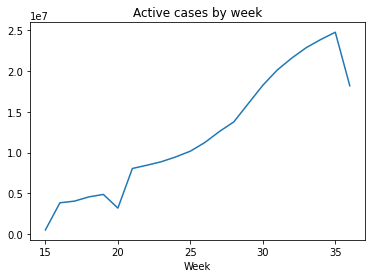

In [55]:
df.groupby('Week')['Active'].sum().plot(title="Active cases by week")

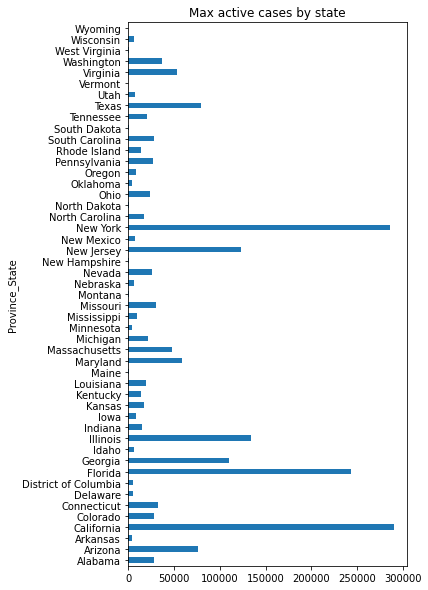

In [56]:
df.groupby('Province_State')['Active'].mean().plot(kind='barh',figsize=(5,10), title="Max active cases by state")

In [57]:
#We're mapping the daily change in active cases compared to a weekly average baseline
df['Prev_Day_Active'] = df.groupby('Province_State')['Active'].shift(1)
df['Prev_Day_Change'] = df['Active'] - df['Prev_Day_Active']

df['weekly_average'] = df.groupby('Week')['Prev_Day_Change'].transform('mean')

#Sample output to check our work
df[df['Short_Date'] == '6-15'].head()

,Province_State,Last_Update,Active,Week,Day,Month,Short_Date,Prev_Day_Active,Prev_Day_Change,weekly_average
83,Alabama,2020-06-15 03:33:25,11334.0,25,15,6,6-15,7066.0,4268.0,-5445.096491
222,Arizona,2020-06-15 03:33:25,28182.0,25,15,6,6-15,106324.0,-78142.0,-5445.096491
244,Arkansas,2020-06-15 03:33:25,4212.0,25,15,6,6-15,6510.0,-2298.0,-5445.096491
395,Colorado,2020-06-15 03:33:25,23339.0,25,15,6,6-15,23614.0,-275.0,-5445.096491
513,Connecticut,2020-06-15 03:33:25,33276.0,25,15,6,6-15,26317.0,6959.0,-5445.096491


In [58]:
#Use pivot to summarize active cases by week by state
df_pivot = pd.pivot_table(df, values = 'Prev_Day_Change', index=['Province_State'], columns = 'Short_Date').reset_index().fillna(0)
df_pivot.head()

Short_Date,Province_State,4-12,4-13,4-14,4-15,4-16,4-17,4-19,4-20,4-21,4-24,4-25,4-26,4-27,4-28,4-30,5-10,5-11,5-14,5-17,5-18,5-19,5-2,5-20,5-21,5-22,5-23,5-24,5-25,5-26,5-27,5-28,5-29,5-3,5-30,5-31,5-4,5-7,5-8,5-9,...,7-5,7-6,7-7,7-8,7-9,8-1,8-10,8-11,8-12,8-13,8-14,8-15,8-16,8-17,8-18,8-19,8-2,8-20,8-21,8-22,8-23,8-24,8-25,8-26,8-27,8-28,8-29,8-3,8-30,8-31,8-4,8-5,8-6,8-7,8-8,8-9,9-1,9-2,9-3,9-4
0,Alabama,-52157.0,-5861.0,-3185.0,-1221.0,-41099.0,-39741.0,-19091.0,-45826.0,-13095.0,-9668.0,-11227.0,1394.0,-13571.0,-46034.0,345.0,696.0,-3123.0,1438.0,3591.0,-24705.0,-28708.0,-25085.0,6956.0,5525.0,229.0,-6419.0,2147.0,-2653.0,-12308.0,-4164.0,-5946.0,-50371.0,2592.0,-16555.0,917.0,-21040.0,-3959.0,-325.0,-17681.0,...,5514.0,15730.0,14670.0,16468.0,9412.0,38005.0,53295.0,8884.0,-1475.0,-9538.0,-4808.0,-1268.0,-4202.0,-4169.0,-235.0,59579.0,-4290.0,174.0,-4730.0,2871.0,6456.0,59950.0,4990.0,7628.0,7037.0,917.0,-2995.0,33552.0,5698.0,177.0,49043.0,-5008.0,39380.0,48197.0,46771.0,12130.0,3798.0,1540.0,-1030.0,2189.0
1,Arizona,-158022.0,-6232.0,-141136.0,-64350.0,-86820.0,-75254.0,-26610.0,-5074.0,-149001.0,-8745.0,-54106.0,1136.0,-91033.0,-131281.0,-120001.0,843.0,-102274.0,2192.0,-11826.0,-363.0,-132874.0,-144080.0,-77612.0,-35281.0,-52688.0,5852.0,319.0,-313.0,-73353.0,-60908.0,-139893.0,-38222.0,-5654.0,-143122.0,-141426.0,-112075.0,-1054.0,-41463.0,-148984.0,...,-54342.0,-48070.0,74093.0,-37435.0,40201.0,119420.0,0.0,113666.0,-5771.0,-5507.0,-1148.0,30125.0,-4132.0,-1241.0,-1426.0,151978.0,26310.0,-2139.0,-355.0,-1791.0,3938.0,5749.0,4627.0,6277.0,3130.0,969.0,-535.0,145766.0,-175.0,162665.0,51059.0,47315.0,150466.0,79579.0,150046.0,150126.0,567.0,508.0,-847.0,1165.0
2,Arkansas,-5380.0,-5197.0,-4898.0,-1327.0,-4684.0,-5245.0,-5195.0,-916.0,-4943.0,840.0,-4119.0,1855.0,-4966.0,-4561.0,-3501.0,-5889.0,-3883.0,-152.0,-2128.0,-5574.0,-4499.0,-5709.0,-1936.0,-3661.0,-4324.0,-4428.0,-4653.0,-5143.0,-1287.0,776.0,-6022.0,172.0,-3070.0,-4393.0,401.0,-174.0,-517.0,-1801.0,-4426.0,...,-180.0,703.0,-1273.0,4635.0,4483.0,5392.0,6468.0,3579.0,353.0,1890.0,241.0,505.0,-1039.0,-88.0,1000.0,4240.0,-662.0,607.0,-693.0,-65.0,371.0,127.0,-252.0,-1535.0,-1768.0,-1146.0,165.0,5950.0,-193.0,191.0,4328.0,2478.0,-375.0,5295.0,719.0,1316.0,430.0,26.0,-654.0,-135.0
3,California,-2434.0,-10966.0,0.0,-17361.0,895.0,-11614.0,-11579.0,10306.0,7462.0,9908.0,16517.0,10425.0,9372.0,2508.0,-12812.0,-140814.0,-411121.0,-109358.0,-39457.0,-25619.0,-94853.0,-28278.0,-237143.0,-41486.0,-33276.0,-26324.0,-128862.0,37579.0,45830.0,-190274.0,-143130.0,-125330.0,-386877.0,-276646.0,-152557.0,-391153.0,-137154.0,-402470.0,-64817.0,...,153930.0,168042.0,63618.0,-229971.0,156683.0,426458.0,466869.0,299161.0,-83881.0,-103957.0,-19662.0,-45001.0,-92677.0,-66514.0,-94406.0,565470.0,47641.0,-27742.0,-28193.0,28835.0,16720.0,-32017.0,566171.0,88027.0,72519.0,-23323.0,-8434.0,-41302.0,120721.0,80384.0,411842.0,372059.0,462646.0,174101.0,-12688.0,27080.0,42326.0,-5497.0,120850.0,72068.0
4,Colorado,-34652.0,-546.0,-14763.0,243.0,-15552.0,696.0,-24511.0,-19416.0,-4567.0,-20396.0,-16364.0,-6299.0,-30524.0,-32828.0,-13361.0,-8561.0,-11882.0,-26286.0,-7741.0,-5679.0,9313.0,-7135.0,-22919.0,-5319.0,9039.0,-16262.0,1005.0,-17642.0,-16793.0,-826.0,-13803.0,-8412.0,-6658.0,-676.0,-6997.0,-28909.0,-23454.0,-5346.0,-2796.0,...,3342.0,-2932.0,2844.0,19005.0,-406.0,22012.0,4564.0,10938.0,-3432.0,-1506.0,-2891.0,1018.0,-1286.0,-941.0,1072.0,12910.0,19289.0,652.0,-1962.0,1555.0,-1024.0,20872.0,-434.0,858.0,1926.0,4257.0,3646.0,14811.0,-171.0,-992.0,8630.0,2826.0,27558.0,29811.0,32538.0,20059.0,356.0,947.0,212.0,252.0


In [59]:
#Lets get our map data
!pip install geopandas 
import geopandas as gpd
fp = 'gz_2010_us_040_00_5m.json'

states = gpd.read_file(fp)

In [60]:
#Now we need to join our two data sets using the state name as key
merged = states.set_index('NAME').join(df_pivot.set_index('Province_State'))

In [61]:
import matplotlib.pyplot as plt 
import matplotlib as mpl 

#creating a function to draw our choropleth for a given column name
def create_figure(date, weekly_avg):
  # create figure and axes for Matplotlib
  fig, ax = plt.subplots(1, figsize=(10, 6))
  # create map
  merged.plot(column=date, cmap='cool', linewidth=0.8, ax=ax, edgecolor='0.8')

  #Map formatting
  ax.axis('off')

  title = 'Covid-19 \n Hot spots by state'
  ax.set_title(title, fontdict={'fontsize': '20', 'fontweight': '3'})
  # create an annotation for the data source
  ax.annotate('Source: CSSE at Johns Hopkins University, 2020',xy=(0.1, .08),  xycoords='figure fraction', horizontalalignment='left', verticalalignment='top', fontsize=12, color='#555555')

  #weekly average and date annotations
  ax.annotate(f'Date: {date}',xy=(0.1, .20),  xycoords='figure fraction', horizontalalignment='left', verticalalignment='top', fontsize=14, color='black')
  ax.annotate(f'Average weekly change: {weekly_avg}',xy=(0.1, .16),  xycoords='figure fraction', horizontalalignment='left', verticalalignment='top', fontsize=14, color='black')
  
  fig.savefig(f'map_export_{date}.png', dpi=100)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `fi

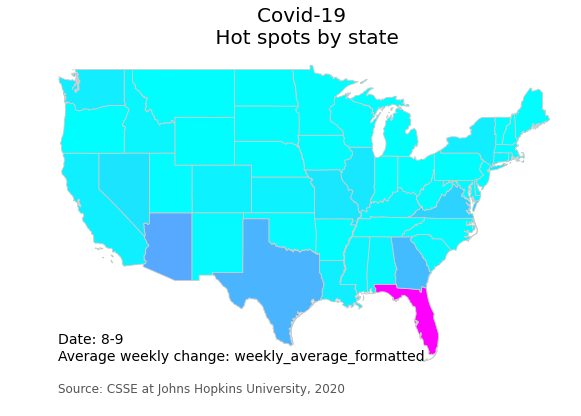

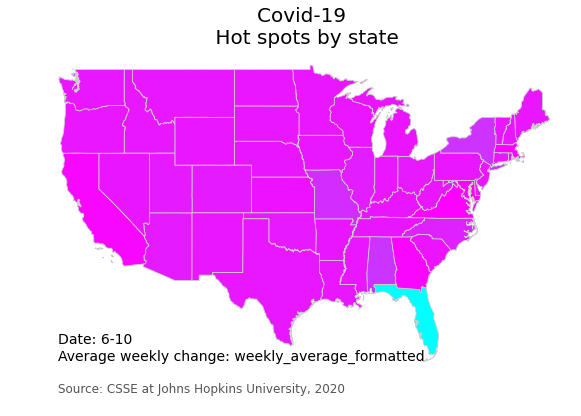

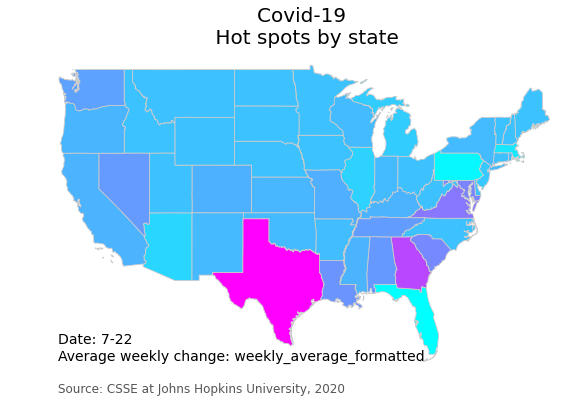

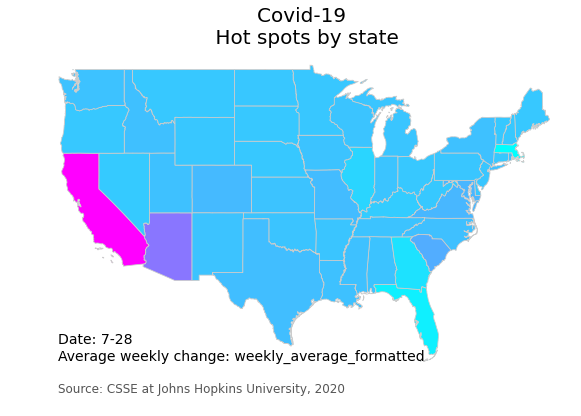

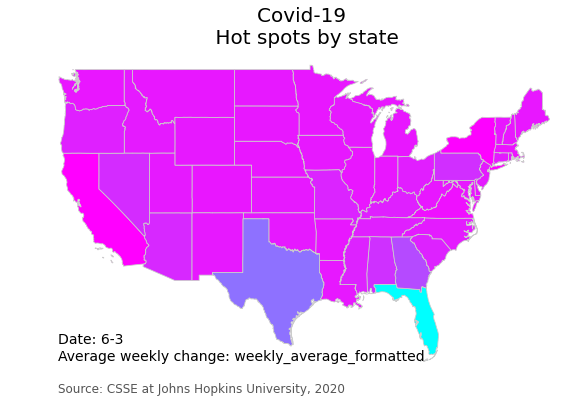

...

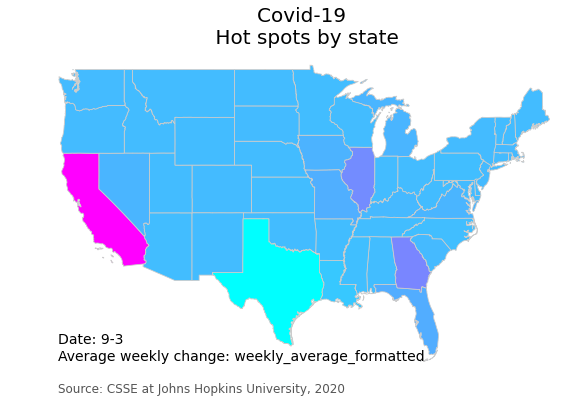

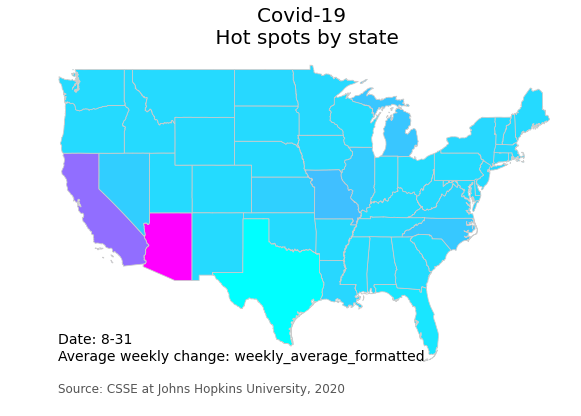

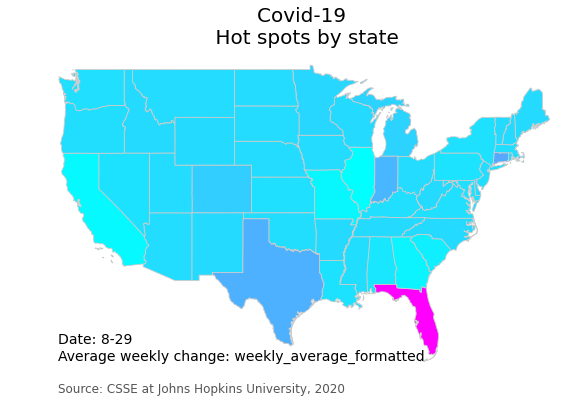

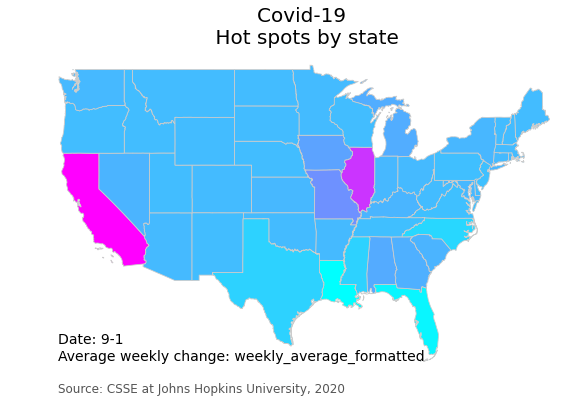

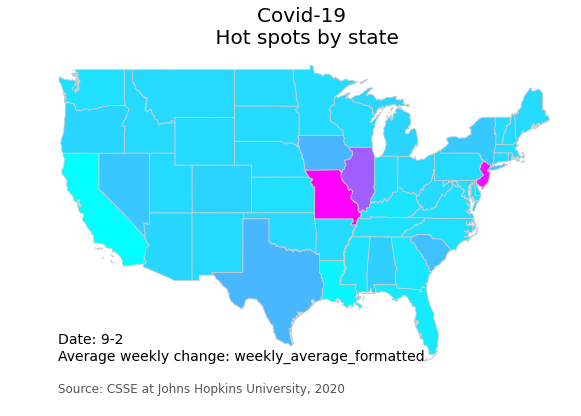

In [63]:
dates = df['Short_Date'].unique().tolist()
dates.pop(0) #remove first date as prev day means no change value

for date in dates:
  avg = df['weekly_average'][df['Short_Date']== date].unique()
  weekly_average_formatted = '%+d cases' % avg[0].round(0) 
  create_figure(date, 'weekly_average_formatted')



In [ ]:
!zip -r -r /content/images.zip /content/

from google.colab import files
files.download("/content/images.zip")